In [1]:
from matplotlib.colors import ListedColormap
from PIL import Image
import logging
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tiatoolbox.tools.patchextraction import SlidingWindowPatchExtractor
from wholeslidedata.image.wholeslideimage import WholeSlideImage
from tiatoolbox.wsicore.wsireader import WSIReader

|2025-07-10|21:45:33.913| [WARNING] /cluster/home/srivash/miniforge3/envs/tiatoolbox-gpu/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()



In [5]:
import logging
import warnings
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import torch
from matplotlib import cm
if logging.getLogger().hasHandlers():
    logging.getLogger().handlers.clear()

mpl.rcParams["figure.dpi"] = 300  # for high resolution figure in notebook
mpl.rcParams["figure.facecolor"] = "white"  # To make sure text is visible in dark mode
warnings.filterwarnings("ignore")

In [6]:

tiles_dir = 'Output5'



In [7]:
import glob
img_paths = sorted(glob.glob(roi_img_dir))

In [20]:
from tiatoolbox.models.engine.semantic_segmentor import (
    IOSegmentorConfig,
    SemanticSegmentor,)

# Define your segmentor
# Tile prediction
bcc_segmentor = SemanticSegmentor(
    pretrained_model="fcn_resnet50_unet-bcss",
    num_loader_workers=4,
    batch_size=4,
)

output = bcc_segmentor.predict(
    [img_file_name],
    save_dir="clean_til/",
    mode="tile",
    resolution=1.0,
    units="baseline",
    patch_input_shape=[1024, 1024],
    patch_output_shape=[512, 512],
    stride_shape=[512, 512],
    device=device,
    crash_on_exception=True,
)




GPU is not compatible with torch.compile. Compatible GPUs include NVIDIA V100, A100, and H100. Speedup numbers may be lower than expected.


In [21]:
wsi_output = bcc_segmentor.predict(
    imgs=img_paths,
    masks=None,
    save_dir="sample_wsi_results/",
    mode="tile",  # <- Use tile mode for ROI images
    ioconfig=bcc_roi_ioconfig,
    device="cpu",
    crash_on_exception=True,
)


WSIPatchDataset only reads image tile at `units="baseline"`. Resolutions will be converted to baseline value.
WSIPatchDataset only reads image tile at `units="baseline"`. Resolutions will be converted to baseline value.
Raw data is None.
Unknown scale (no objective_power or mpp)
Raw data is None.
Raw data is None.
Raw data is None.
Raw data is None.

INFO:root:Finish: 0
INFO:root:--Input: /lab/deasylab3/Himangi/tnbc_data/roi_imagesroi_TCGA-A1-A0SP-01Z-00-DX1.20D689C6-EFA5-4694-BE76-24475A89ACC0_3000_24862_9000_30896.png
INFO:root:--Output: /lab/deasylab3/Himangi/TNBC_multimodal/sample_wsi_results/0


Raw prediction shape: (6034, 6000, 5)
Processed prediction shape: (6034, 6000)


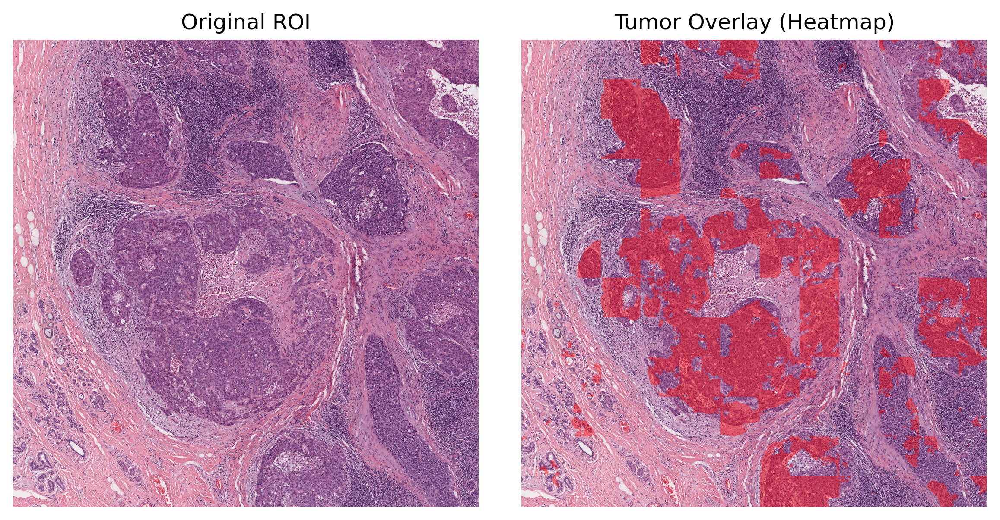

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage import measure
from skimage.draw import polygon_perimeter
import os

# Assume wsi_output[0] = (image_name, prediction_path_prefix)
image_name, prediction_path_prefix = wsi_output[0]

# Load raw prediction (.npy) from disk
tile_prediction_raw = np.load(prediction_path_prefix + ".raw.0.npy")
print("Raw prediction shape:", tile_prediction_raw.shape)

# Convert softmax to class labels (argmax)
tile_prediction = np.argmax(tile_prediction_raw, axis=-1)
print("Processed prediction shape:", tile_prediction.shape)

# Load the original ROI image
img_path = os.path.join("path_to_your_images", image_name)  # change as needed
tile = imread(img_path)
if tile.ndim == 2:
    tile = np.stack([tile]*3, axis=-1)
elif tile.shape[2] == 4:
    tile = tile[:, :, :3]  # Remove alpha channel if present

# Get tumor mask (class 0)
tumor_mask = (tile_prediction == 0).astype(np.uint8)

# Find contours
contours = measure.find_contours(tumor_mask, level=0.5)

# Create overlay with red contours
tile_overlay = tile.copy()
for contour in contours:
    contour = np.round(contour).astype(np.int32)
    rr, cc = polygon_perimeter(contour[:, 0], contour[:, 1], shape=tile_overlay.shape)
    tile_overlay[rr, cc] = [255, 0, 0]  # Red

# Optional: blend tumor heatmap
alpha = 0.4
tumor_overlay = tile.copy()
tumor_overlay[tumor_mask == 1] = (
    (1 - alpha) * tile[tumor_mask == 1] + alpha * np.array([255, 0, 0])
).astype(np.uint8)



plt.figure(figsize=(8, 4))  # Wider for side-by-side

plt.subplot(1, 2, 1)
plt.imshow(tile)
plt.title("Original ROI")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(tumor_overlay)
plt.title("Tumor Overlay (Heatmap)")
plt.axis("off")

plt.tight_layout()
plt.show()




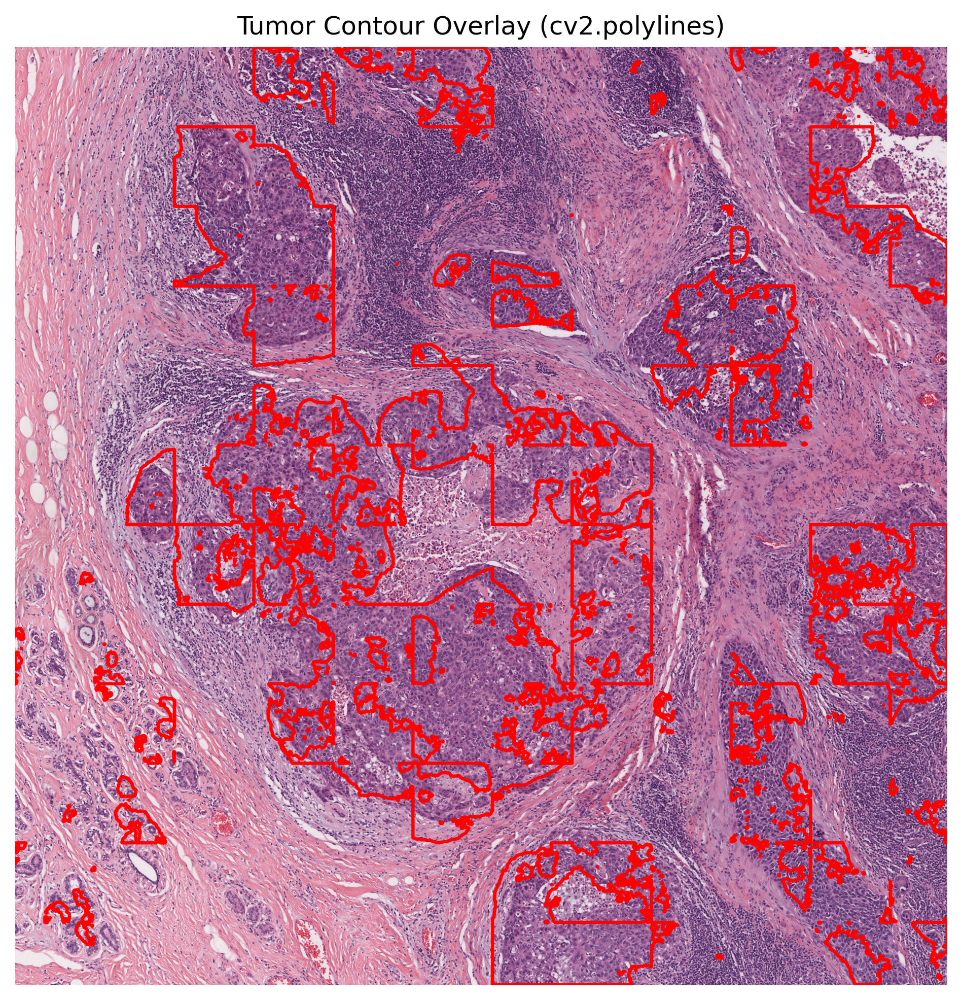

In [36]:
import cv2

# Make sure image is RGB and uint8
tile_overlay = tile.copy()
if tile_overlay.ndim == 2:
    tile_overlay = np.stack([tile_overlay] * 3, axis=-1)
elif tile_overlay.shape[2] == 4:
    tile_overlay = tile_overlay[:, :, :3]

tile_overlay = tile_overlay.copy()

# Convert contours to OpenCV format and draw them
for contour in contours:
    contour = np.round(contour).astype(np.int32)
    if len(contour) < 3:
        continue  # Need at least 3 points for a polygon

    # OpenCV expects shape: (n_points, 1, 2)
    contour_cv = contour[:, [1, 0]].reshape(-1, 1, 2)  # Flip (row, col) -> (x, y)

    # Draw contour with thickness 2 and red color
    cv2.polylines(tile_overlay, [contour_cv], isClosed=True, color=(255, 0, 0), thickness=20)

# Show overlay
plt.figure(figsize=(12, 8))
plt.imshow(tile_overlay)
plt.title("Tumor Contour Overlay (cv2.polylines)")
plt.axis("off")
plt.show()


In [38]:
import json
from skimage import measure

# Label tumor mask for region-based analysis
from skimage.measure import label, regionprops

labeled_mask = label(tumor_mask)

regions = regionprops(labeled_mask)

# Export basic region info to JSON
features = []
for i, region in enumerate(regions):
    if region.area < 100:  # filter out noise
        continue
    features.append({
        "id": i,
        "area": region.area,
        "perimeter": region.perimeter,
        "centroid": region.centroid,
        "bbox": region.bbox,
        "eccentricity": region.eccentricity,
        "solidity": region.solidity,
        "extent": region.extent,
        "compactness": 4 * np.pi * region.area / (region.perimeter ** 2 + 1e-6),  # avoid div by 0
    })

with open("tumor_regions_morphology.json", "w") as f:
    json.dump(features, f, indent=2)

print(f"✅ Exported {len(features)} tumor regions with morphological features.")



✅ Exported 232 tumor regions with morphological features.


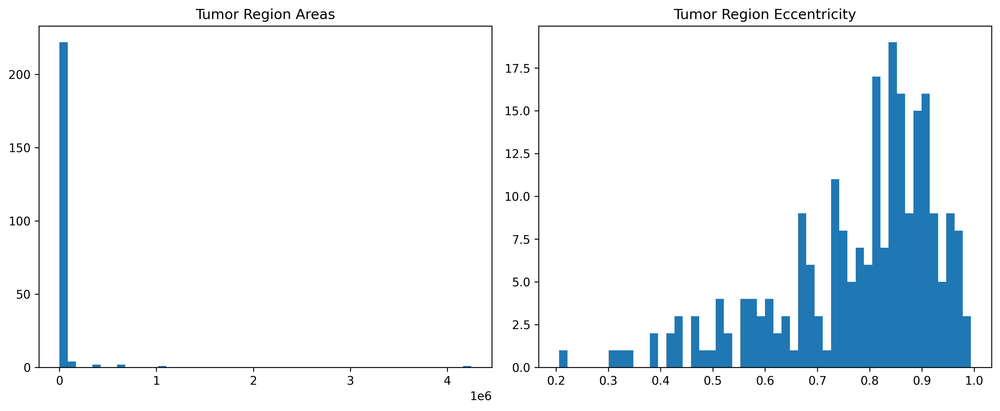

In [39]:
import matplotlib.pyplot as plt

areas = [f["area"] for f in features]
eccentricities = [f["eccentricity"] for f in features]

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(areas, bins=50)
plt.title("Tumor Region Areas")

plt.subplot(1, 2, 2)
plt.hist(eccentricities, bins=50)
plt.title("Tumor Region Eccentricity")

plt.tight_layout()
plt.show()


In [28]:
import logging
from tiatoolbox import logger
logger.info(
    "Prediction method output is: %s, %s",
    wsi_output[0][0],
    wsi_output[0][1],
)
wsi_prediction_raw = np.load(
    wsi_output[0][1] + ".raw.0.npy",
)  # Loading the first prediction [0] based on the output address [1]
logger.info(
    "Raw prediction dimensions: (%d, %d, %d)",
    wsi_prediction_raw.shape[0],
    wsi_prediction_raw.shape[1],
    wsi_prediction_raw.shape[2],
)

# Simple processing of the raw prediction to generate semantic segmentation task
wsi_prediction = np.argmax(
    wsi_prediction_raw,
    axis=-1,
)  # select the class with highest probability
logger.info(
    "Processed prediction dimensions: (%d, %d)",
    wsi_prediction.shape[0],
    wsi_prediction.shape[1],
)

# [WSI overview extraction]
# Now reading the WSI to extract it's overview
wsi = WSIReader.open(roi_img_dir)
logger.info(
    "WSI original dimensions: (%d, %d)",
    wsi.info.slide_dimensions[0],
    wsi.info.slide_dimensions[1],
)

# using the prediction save_resolution to create the wsi overview at the same resolution
overview_info = bcc_roi_ioconfig.save_resolution

# extracting slide overview using `slide_thumbnail` method
wsi_overview = wsi.slide_thumbnail(
    resolution=overview_info["resolution"],
    units=overview_info["units"],
)
logger.info(
    "WSI overview dimensions: (%d, %d)",
    wsi_overview.shape[0],
    wsi_overview.shape[1],
)
plt.figure(), plt.imshow(wsi_overview)
plt.axis("off")

# [Overlay map creation]
# creating label-color dictionary to be fed into `overlay_prediction_mask` function
# to help generating color legend
label_dict = {"Tumour": 0, "Stroma": 1, "Inflamatory": 2, "Necrosis": 3, "Others": 4}
label_color_dict = {}
colors = cm.get_cmap("Set1").colors
for class_name, label in label_dict.items():
    label_color_dict[label] = (class_name, 255 * np.array(colors[label]))
# Creat overlay map using the `overlay_prediction_mask` helper function
overlay = overlay_prediction_mask(
    wsi_overview,
    wsi_prediction,
    alpha=0.5,
    label_info=label_color_dict,
    return_ax=True,
)

INFO:root:Prediction method output is: /lab/deasylab3/Himangi/tnbc_data/roi_imagesroi_TCGA-A1-A0SP-01Z-00-DX1.20D689C6-EFA5-4694-BE76-24475A89ACC0_3000_24862_9000_30896.png, /lab/deasylab3/Himangi/TNBC_multimodal/sample_wsi_results/0
INFO:root:Raw prediction dimensions: (6034, 6000, 5)
INFO:root:Processed prediction dimensions: (6034, 6000)
INFO:root:WSI original dimensions: (6000, 6034)


ValueError: MPP is None. Cannot determine scale in terms of MPP.

In [30]:
from tiatoolbox.models.engine.semantic_segmentor import (
    IOSegmentorConfig,
    SemanticSegmentor,
)
bcc_segmentor = SemanticSegmentor(
    pretrained_model="fcn_resnet50_unet-bcss",
    num_loader_workers=4,
    batch_size=4,
    auto_generate_mask=False,
)

bcc_wsi_ioconfig = IOSegmentorConfig(
    input_resolutions=[{"units": "mpp", "resolution": 0}],
    output_resolutions=[{"units": "mpp", "resolution": 0}],
    patch_input_shape=[1024, 1024],
    patch_output_shape=[512, 512],
    stride_shape=[512, 512],
    save_resolution={"units": "mpp", "resolution": 1.0},
)

|2025-07-10|12:12:24.833| [WARNING] GPU is not compatible with torch.compile. Compatible GPUs include NVIDIA V100, A100, and H100. Speedup numbers may be lower than expected.


In [32]:
png_paths = sorted(glob.glob(os.path.join("tiles", "*.png")))



In [38]:
# Tile prediction
bcc_segmentor = SemanticSegmentor(
    pretrained_model="fcn_resnet50_unet-bcss",
    num_loader_workers=4,
    batch_size=4,
)



|2025-07-10|12:16:44.689| [WARNING] GPU is not compatible with torch.compile. Compatible GPUs include NVIDIA V100, A100, and H100. Speedup numbers may be lower than expected.


In [45]:
import os
import shutil

results_dir = "semantic_segmentation_results/"

if os.path.exists(results_dir):
    shutil.rmtree(results_dir)
    print(f"Deleted existing directory: {results_dir}")
else:
    print(f"No directory to delete: {results_dir}")


Deleted existing directory: semantic_segmentation_results/


In [ ]:
output = bcc_segmentor.predict(
    png_paths,
    save_dir=results_dir,
    mode="tile",
    resolution=1.0,
    units="baseline",
    patch_input_shape=[224, 224],
    patch_output_shape=[224, 224],
    stride_shape=[224, 224],
    device="cpu",
    crash_on_exception=False,
)

|2025-07-10|12:18:31.494| [WARNING] WSIPatchDataset only reads image tile at `units="baseline"`. Resolutions will be converted to baseline value.
|2025-07-10|12:18:31.533| [WARNING] WSIPatchDataset only reads image tile at `units="baseline"`. Resolutions will be converted to baseline value.
|2025-07-10|12:18:31.579| [WARNING] Raw data is None.
|2025-07-10|12:18:31.580| [WARNING] Unknown scale (no objective_power or mpp)
|2025-07-10|12:18:31.762| [WARNING] Raw data is None.
Process Batch: 100%|##############################| 1/1 [00:04<00:00,  4.49s/it]

|2025-07-10|12:18:36.109| [INFO] Finish: 0
|2025-07-10|12:18:36.109| [INFO] --Input: tiles/patch_0001_x0_y0.png
|2025-07-10|12:18:36.109| [INFO] --Output: /lab/deasylab3/Himangi/TNBC_multimodal/semantic_segmentation_results/0



|2025-07-10|12:18:36.153| [WARNING] Raw data is None.
|2025-07-10|12:18:36.153| [WARNING] Unknown scale (no objective_power or mpp)
|2025-07-10|12:18:36.178| [WARNING] Raw data is None.

|2025-07-10|12:18:41.119| [ERROR] Crashed on /lab/deasylab3/Himangi/TNBC_multimodal/semantic_segmentation_results/1
Traceback (most recent call last):
  File "/cluster/home/srivash/miniforge3/envs/tiatoolbox-gpu/lib/python3.10/site-packages/tiatoolbox/models/engine/semantic_segmentor.py", line 1242, in _predict_wsi_handle_exception
    shutil.copy(map_file_path, old_map_file_path)
  File "/cluster/home/srivash/miniforge3/envs/tiatoolbox-gpu/lib/python3.10/shutil.py", line 418, in copy
    copymode(src, dst, follow_symlinks=follow_symlinks)
  File "/cluster/home/srivash/miniforge3/envs/tiatoolbox-gpu/lib/python3.10/shutil.py", line 307, in copymode
    chmod_func(dst, stat.S_IMODE(st.st_mode))
PermissionError: [Errno 1] Operation not permitted: '/lab/deasylab3/Himangi/TNBC_multimodal/semantic_segmentat

In [51]:

from tiatoolbox import logger
logger.info(
    "Prediction method output is: %s, %s",
    output[0][0],
    output[0][1],
)

In [53]:
output[0][1]

'/lab/deasylab3/Himangi/TNBC_multimodal/semantic_segmentation_results/0'

In [54]:
tile_prediction_raw = np.load(
    output[0][1] + ".raw.0.npy",
)  # Loading the first prediction [0] based on the output address [1]
logger.info(
    "Raw prediction dimensions: (%d, %d, %d)",
    tile_prediction_raw.shape[0],
    tile_prediction_raw.shape[1],
    tile_prediction_raw.shape[2],
)





In [59]:
tile_prediction = np.argmax(
    tile_prediction_raw,
    axis=-1,
) 

In [60]:
tile_prediction

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

In [62]:
tile_prediction.shape[1]

224

In [63]:
tile_prediction_raw[:, :, 0]

array([[0.02479663, 0.0249863 , 0.02536566, ..., 0.01680418, 0.0162939 ,
        0.01603877],
       [0.02480896, 0.02499437, 0.0253652 , ..., 0.01687531, 0.01635672,
        0.01609743],
       [0.02483363, 0.02501051, 0.02536428, ..., 0.01701756, 0.01648235,
        0.01621475],
       ...,
       [0.12378622, 0.11958751, 0.11119007, ..., 0.01755645, 0.01754716,
        0.01754252],
       [0.12566362, 0.12152733, 0.11325476, ..., 0.01751094, 0.01749549,
        0.01748776],
       [0.12660232, 0.12249725, 0.11428709, ..., 0.01748819, 0.01746965,
        0.01746039]], dtype=float32)

In [71]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import re
import joblib  # or use `torch.load()` or `np.load()` depending on how .py is saved
import torch

# === CONFIGURATION ===
tile_folder = "tiles"
pred_folder = "semantic_segmentation_results"
overlay_folder = "/lab/deasylab3/Himangi/tnbc_data/tumor_overlay_tiles"
output_stitched = "/lab/deasylab3/Himangi/tnbc_data/stitched_tumor_roi.png"



TILE_SIZE = 224
TUMOR_CLASS_ID = 0



os.makedirs(overlay_folder, exist_ok=True)

# === Get sorted lists ===
tile_files = sorted(
    [f for f in os.listdir(tile_folder) if f.endswith(".png")],
    key=lambda x: int(re.search(r"patch_(\d+)", x).group(1))
)

pred_files = sorted(
    [f for f in os.listdir(pred_folder) if f.endswith(".npy")],
    key=lambda x: int(re.search(r"^(\d+)", x).group(1))
)

assert len(tile_files) == len(pred_files), "Tile/prediction count mismatch"

tile_positions = {}
max_x = max_y = 0

print("🔄 Generating tumor overlays...")

# === STEP 1: Create tumor overlay tiles ===
for tile_file, pred_file in zip(tile_files, pred_files):
    tile_id = os.path.splitext(tile_file)[0]
    tile_path = os.path.join(tile_folder, tile_file)
    pred_path = os.path.join(pred_folder, pred_file)
    overlay_path = os.path.join(overlay_folder, f"{tile_id}.png")

    # Extract x and y from tile filename
    match = re.search(r"x(\d+)_y(\d+)", tile_file)
    if not match:
        print(f"⚠️ Skipping: can't parse coordinates from {tile_file}")
        continue
    x_offset, y_offset = int(match.group(1)), int(match.group(2))
    tile_positions[tile_id] = (x_offset, y_offset)
    max_x, max_y = max(max_x, x_offset), max(max_y, y_offset)

    # Load tile image and prediction
    tile = imread(tile_path)
    try:
        pred_raw = np.load(pred_path, allow_pickle=True)
    except Exception as e:
        print(f"❌ Error loading {pred_file}: {e}")
        continue

    # Get semantic label map
    if pred_raw.ndim == 3:
        label_map = pred_raw.argmax(axis=-1)
    elif pred_raw.ndim == 2:
        label_map = pred_raw
    else:
        print(f"❌ Unexpected shape: {pred_raw.shape}")
        continue

    # Create tumor mask and extract contours
    tumor_mask = (label_map == TUMOR_CLASS_ID).astype(np.uint8) * 255
    contours, _ = cv2.findContours(tumor_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours on tile
    overlay = tile.copy()
    for cnt in contours:
        if cv2.contourArea(cnt) > 10:
            cv2.drawContours(overlay, [cnt], -1, (255, 0, 0), 1)

    # Save overlay
    cv2.imwrite(overlay_path, cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

print("✅ All tumor overlay tiles saved.\n")

# === STEP 2: Stitch into full ROI image ===
stitched_width = max_x + TILE_SIZE
stitched_height = max_y + TILE_SIZE
stitched_image = np.zeros((stitched_height, stitched_width, 3), dtype=np.uint8)

print("🧩 Stitching ROI...")

for tile_id, (x, y) in tile_positions.items():
    overlay_path = os.path.join(overlay_folder, f"{tile_id}.png")
    if not os.path.exists(overlay_path):
        continue
    tile_img = cv2.imread(overlay_path)
    stitched_image[y:y+TILE_SIZE, x:x+TILE_SIZE] = tile_img

cv2.imwrite(output_stitched, stitched_image)
print(f"✅ Tumor contour ROI saved to:\n➡️ {output_stitched}")


🔄 Generating tumor overlays...
✅ All tumor overlay tiles saved.

🧩 Stitching ROI...
✅ Tumor contour ROI saved to:
➡️ /lab/deasylab3/Himangi/tnbc_data/stitched_tumor_roi.png
